In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2

from google.colab import drive
drive.mount('/content/drive')

path = '/content/drive/My Drive/ecse415/Assignments/a1/'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 1. Thresholding

In [ ]:
image_path = path+"images/numbers.jpg"
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

### 1.1. Simple Binary Thresholding











In [ ]:
def simple_binary_threshold(img_sbt, T):
    
    # define a result image similar size to input image
    res = np.zeros_like(img_sbt)
    
    # do simple binary thresholding wherethresholding
    res[img_sbt>T] = 255
    
    return res

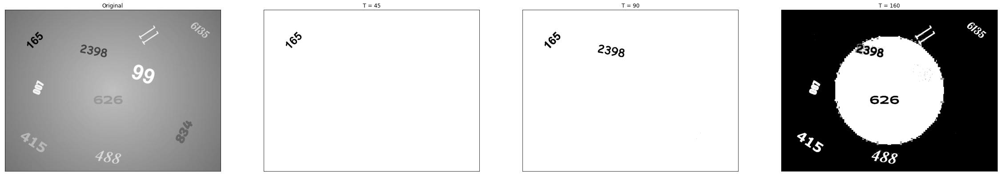

In [ ]:
img_res_45 = simple_binary_threshold(img, 45)
img_res_90 = simple_binary_threshold(img, 90)
img_res_160 = simple_binary_threshold(img, 160)

# display image
plt.figure(figsize=(40, 40))
plt.subplot(141), plt.imshow(img, cmap="gray")
plt.title("Original"), plt.xticks([]), plt.yticks([])
plt.subplot(142), plt.imshow(img_res_45, cmap="gray")
plt.title("T = 45"), plt.xticks([]), plt.yticks([])
plt.subplot(143), plt.imshow(img_res_90, cmap="gray")
plt.title("T = 90"), plt.xticks([]), plt.yticks([])
plt.subplot(144), plt.imshow(img_res_160, cmap="gray")
plt.title("T = 160"), plt.xticks([]), plt.yticks([])
plt.show()

### 1.2. 

T == 45:  

*   Only 165 is segmented.
*   White background
*   The threshold is low, so the relatively lighter numbers and background (in comparison to 165) turn white

T == 90:

*   165 and 2398 segmented.
*   White background

T = 160: 

*   2398,626,007,415,488,11,6135 segmented.
*   A white circle in the middle, the rest of the background is black. This makes sense because as you go outwards in
all directions from the center of the original image, the background gets darker.












### 1.3. Window Binary Thresholding

In [ ]:
def window_binary_threshold(img_sbt, T1, T2):
    
    # define a result image similar size to input image
    res = np.zeros_like(img_sbt)
    
    # do window binary thresholding
    res[(T1 < img_sbt) & (img_sbt< T2)] = 255
    
    return res

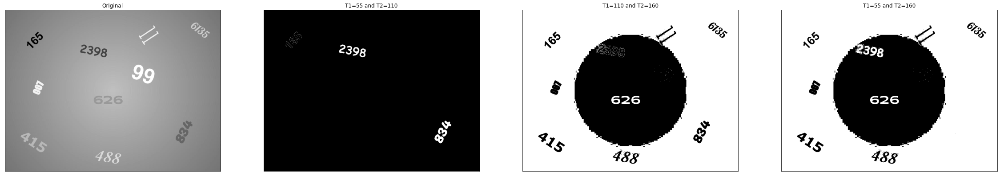

In [ ]:
img_res_55_110 = window_binary_threshold(img, 55, 110)
img_res_110_160 = window_binary_threshold(img, 110, 160)
img_res_55_160 = window_binary_threshold(img, 55, 160)

# display image
plt.figure(figsize=(40, 40))
plt.subplot(141), plt.imshow(img, cmap="gray")
plt.title("Original"), plt.xticks([]), plt.yticks([])
plt.subplot(142), plt.imshow(img_res_55_110, cmap="gray")
plt.title("T1=55 and T2=110"), plt.xticks([]), plt.yticks([])
plt.subplot(143), plt.imshow(img_res_110_160, cmap="gray")
plt.title("T1=110 and T2=160"), plt.xticks([]), plt.yticks([])
plt.subplot(144), plt.imshow(img_res_55_160, cmap="gray")
plt.title("T1=55 and T2=160"), plt.xticks([]), plt.yticks([])
plt.show()

T1=55 and T2=110:

*   165,2398, 834 segmented
*   Black background
*   Need to put effort to see 165

T1=110 and T2=160:

*   All numbers segmented apart from 99
*   Black circle in the middle, the rest of the background is white

T1=55 and T2=160:

*   All numbers segmented apart from 99 and 834
*   Black circle in the middle, the rest of the background is white

### 1.4.

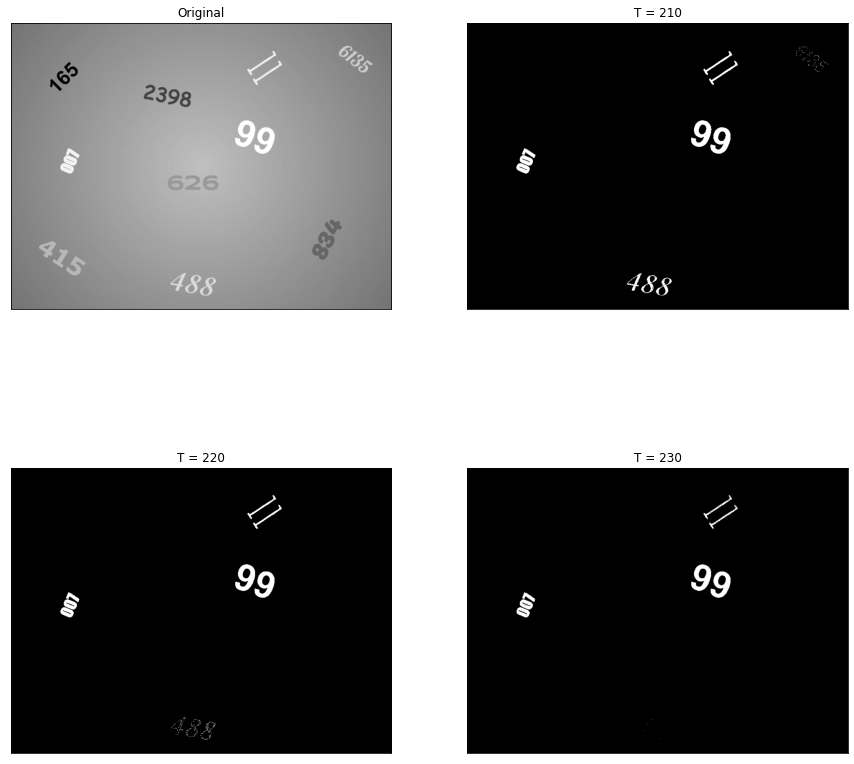

In [ ]:
img_res_210 = simple_binary_threshold(img, 210)
img_res_220 = simple_binary_threshold(img, 220)
img_res_230 = simple_binary_threshold(img, 230)


# display image
plt.figure(figsize=(15, 15))
plt.subplot(221), plt.imshow(img, cmap="gray")
plt.title("Original"), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(img_res_210, cmap="gray")
plt.title("T = 210"), plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(img_res_220, cmap="gray")
plt.title("T = 220"), plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(img_res_230, cmap="gray")
plt.title("T = 230"), plt.xticks([]), plt.yticks([])
plt.show()


*   I used Simple Binary Thresholding
*   11, 99 and 007 are relatively lighter numbers when compared to the rest of the numbers.
*   I increased the threshold value in increments of 10
*   As I increased the threshold value, numbers started disappearing in order of darkness, the darker the colour, the sooner it disappeared into the background



# 2. Denoising

In [ ]:
image_path = path+"images/Tower.png"
img_tower = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

image_path = path+"images/Tower_Gauss_Noise.png"
img_tower_gaussian_noise = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

image_path = path+"images/Tower_Salt_and_Pepper_Noise.png"
img_salt_and_pepper_noise = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

### 2.1. Gaussian Filter Code and Use (Gaussian Noise)




In [ ]:
def gaussian_kernel(size, sigma=2): 

    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    
    return g,x,y

Gaussian Kernel: 
 [[0.0309875  0.03511344 0.0309875 ]
 [0.03511344 0.03978874 0.03511344]
 [0.0309875  0.03511344 0.0309875 ]]

x: 
 [[-1 -1 -1]
 [ 0  0  0]
 [ 1  1  1]]

y: 
 [[-1  0  1]
 [-1  0  1]
 [-1  0  1]]

pad size:  1

Shape of original image:  (800, 569)

Shape of padded image:  (802, 571)


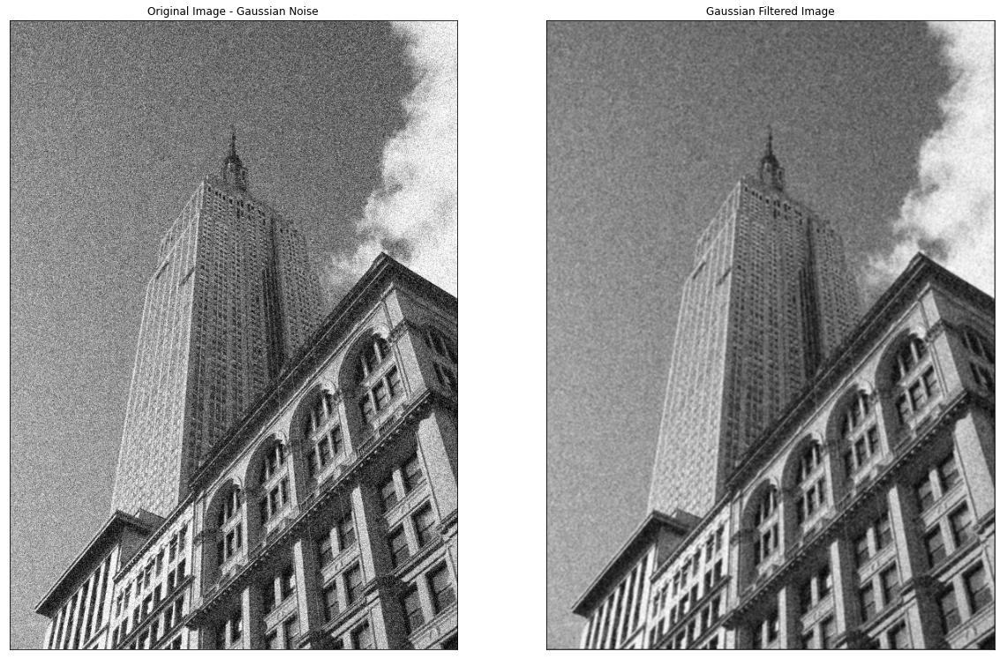

In [ ]:
def gaussian_filter(input_image, kernel_size, sigma):
  
  # get 3x3 gaussain kernel with sigma = 2
  gauss_kernel,x,y = gaussian_kernel(kernel_size,sigma)
  print("Gaussian Kernel: \n", gauss_kernel)
  print("\nx: \n", x)
  print("\ny: \n", y)
  gauss_kernel = gauss_kernel / gauss_kernel.sum() # NORMALIZATION

  # calculate pad_size. In case of 3x3 kernel_size, we want to pad each side with 1 new pixel
  pad_size = np.floor(kernel_size/2).astype("uint8")
  print("\npad size: ", pad_size)

  # pad image. Here we are using constant padding with constant=0, basically zero_padding
  pad_input_image = np.pad(input_image, pad_width=int(pad_size), mode='constant', constant_values=0)

  # Get Height and Width of the original image.
  h, w = pad_input_image.shape
  print("\nShape of original image: ", input_image.shape)  # (800, 569)
  print("\nShape of padded image: ", pad_input_image.shape) # (802, 571)

  # initialize output image to be similar to original image size
  output_image = np.zeros_like(input_image)

  # Now Traverse through image using two for loops
  for i in range(0, h - 2*pad_size): # 0,800
    for j in range(0, w - 2*pad_size): # 0, 569
      output_image[i,j] = (gauss_kernel * pad_input_image[i:i+kernel_size, j:j+kernel_size]).sum()
  
  return output_image

img_result_gaussian = gaussian_filter(img_tower_gaussian_noise, 3, 2)

# display original and gaussian smoothed image
plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(img_tower_gaussian_noise, cmap="gray")
plt.title("Original Image - Gaussian Noise"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img_result_gaussian, cmap="gray")
plt.title("Gaussian Filtered Image"), plt.xticks([]), plt.yticks([])
plt.show()

### 2.2. Box Filter Code and Use (Gaussian Noise)

Box filter: 
 [[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]

pad size:  1

Shape of original image:  (800, 569)

Shape of padded image:  (802, 571)


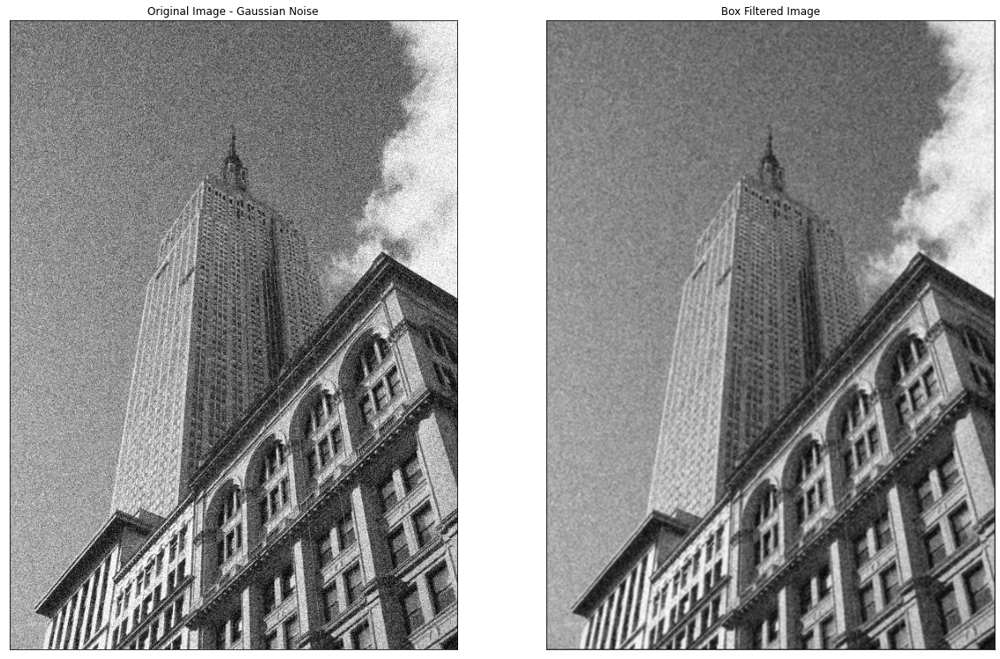

In [ ]:
def box_filter(input_image, kernel_size):
  # Create a custom kernel
  # 3x3 array for box filtering
  kernel_box = np.array([[ 1, 1, 1], 
                         [ 1, 1, 1], 
                         [ 1, 1, 1]])/(9)
  print("Box filter: \n", kernel_box)

  # calculate pad_size. In case of 3x3 kernel_size, we want to pad each side with 1 new pixel
  pad_size = np.floor(kernel_size/2).astype("uint8")
  print("\npad size: ", pad_size)

  # pad image. Here we are using constant padding with constant=0, basically zero_padding
  pad_input_image = np.pad(input_image, pad_width=int(pad_size), mode='constant', constant_values=0)

  # Get Height and Width of the original image.
  h, w = pad_input_image.shape
  print("\nShape of original image: ", input_image.shape)  # (800, 569)
  print("\nShape of padded image: ", pad_input_image.shape) # (802, 571)

  # initialize output image to be similar to original image size
  output_image = np.zeros_like(input_image)

  # Now Traverse through image using two for loops
  for i in range(0, h - 2*pad_size): # 0,800
    for j in range(0, w - 2*pad_size): # 0, 569
      output_image[i,j] = (kernel_box * pad_input_image[i:i+kernel_size, j:j+kernel_size]).sum()
  
  return output_image

img_result_box = box_filter(img_tower_gaussian_noise, 3)

# display original and box filtered image
plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(img_tower_gaussian_noise, cmap="gray")
plt.title("Original Image - Gaussian Noise"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img_result_box, cmap="gray")
plt.title("Box Filtered Image"), plt.xticks([]), plt.yticks([])
plt.show()

### 2.3. Peak-Signal-to-Noise-Ratio (PSNR) -> Gaussian Noise

*   Comparison of Gaussian Filter and Box Filter



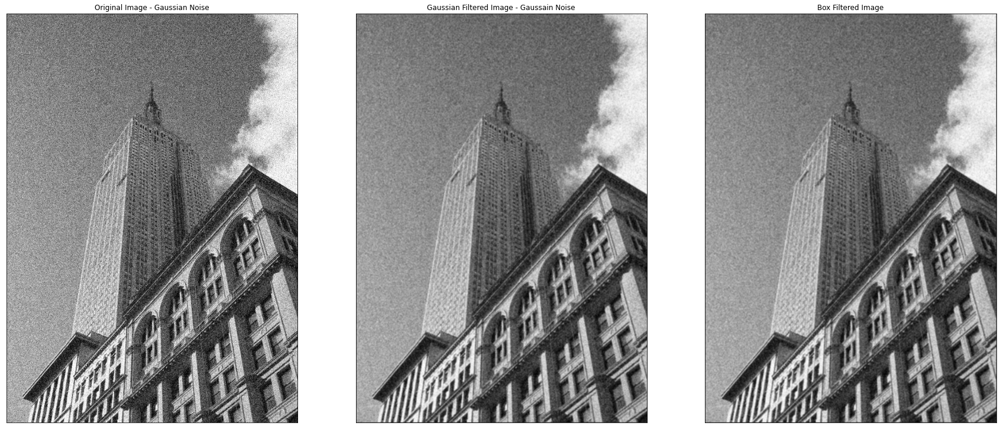

In [ ]:
# display original, gaussian filtered and box filtered image
plt.figure(figsize=(30, 30))
plt.subplot(131), plt.imshow(img_tower_gaussian_noise, cmap="gray")
plt.title("Original Image - Gaussian Noise"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(img_result_gaussian, cmap="gray")
plt.title("Gaussian Filtered Image - Gaussain Noise"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(img_result_box, cmap="gray")
plt.title("Box Filtered Image"), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
base_PSNR = cv2.PSNR(img_tower,img_tower)
gaussian_PSNR = cv2.PSNR(img_tower,img_result_gaussian)
box_PSNR = cv2.PSNR(img_tower,img_result_box)

print("PSNR base: ", base_PSNR)
print("PSNR gaussian: ", gaussian_PSNR)
print("PSNR box: ", box_PSNR)

PSNR base:  361.20199909921956
PSNR gaussian:  24.69877160040515
PSNR box:  24.539892187898502


Despite the PSNR values of gaussian and box filtering being very close, gaussian filtering is superior due to its higher PSNR value.

### 2.4. Gaussian Filter Use (Salt and Pepper Noise)

Gaussian Kernel: 
 [[0.0309875  0.03511344 0.0309875 ]
 [0.03511344 0.03978874 0.03511344]
 [0.0309875  0.03511344 0.0309875 ]]

x: 
 [[-1 -1 -1]
 [ 0  0  0]
 [ 1  1  1]]

y: 
 [[-1  0  1]
 [-1  0  1]
 [-1  0  1]]

pad size:  1

Shape of original image:  (800, 569)

Shape of padded image:  (802, 571)


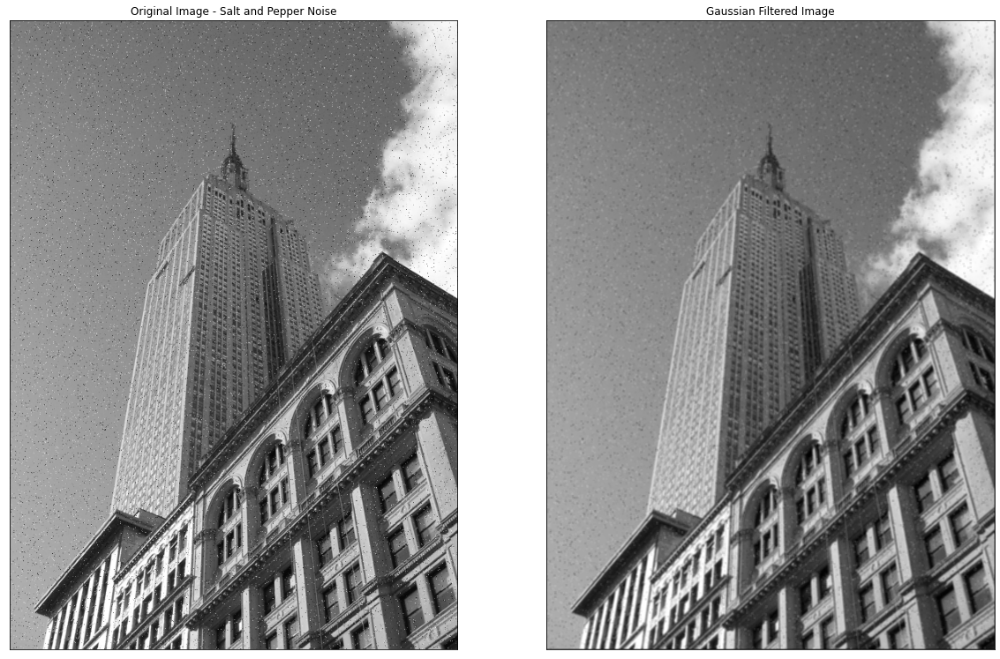

In [ ]:
img_result_gaussian_salt_and_pepper = gaussian_filter(img_salt_and_pepper_noise,3,2)

# display original and gaussian smoothed image
plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(img_salt_and_pepper_noise, cmap="gray")
plt.title("Original Image - Salt and Pepper Noise"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img_result_gaussian_salt_and_pepper, cmap="gray")
plt.title("Gaussian Filtered Image"), plt.xticks([]), plt.yticks([])
plt.show()

### 2.5 Median Filter Code and Use (Salt and Pepper Noise)

In [ ]:
def median_filter(input_image, kernel_size):
    # calculate pad_size
    # in case of 3x3 kernel_size, we want to pad each side with 1 new pixel

    pad_size = np.floor(kernel_size/2).astype("uint8")  # what is astype("uint8")

    # pad image. Here we are using constant padding with constant=0, basically zero_padding
    pad_input_image = np.pad(input_image, pad_width=int(pad_size), mode='constant', constant_values=0)
    print(input_image.shape)

    # Get Height and Width of the original image.
    h, w = pad_input_image.shape 
    print(pad_input_image.shape)

    # initialize output image to be similar to original image size
    output_image = np.zeros_like(input_image)

    # Now Traverse through image using two for loops
    for i in range(0, h - 2*pad_size):  
        for j in range(0, w - 2*pad_size): 
            output_image[i,j] = np.median(pad_input_image[i:i+kernel_size, j:j+kernel_size])

    # return output
    return output_image

(800, 569)
(802, 571)


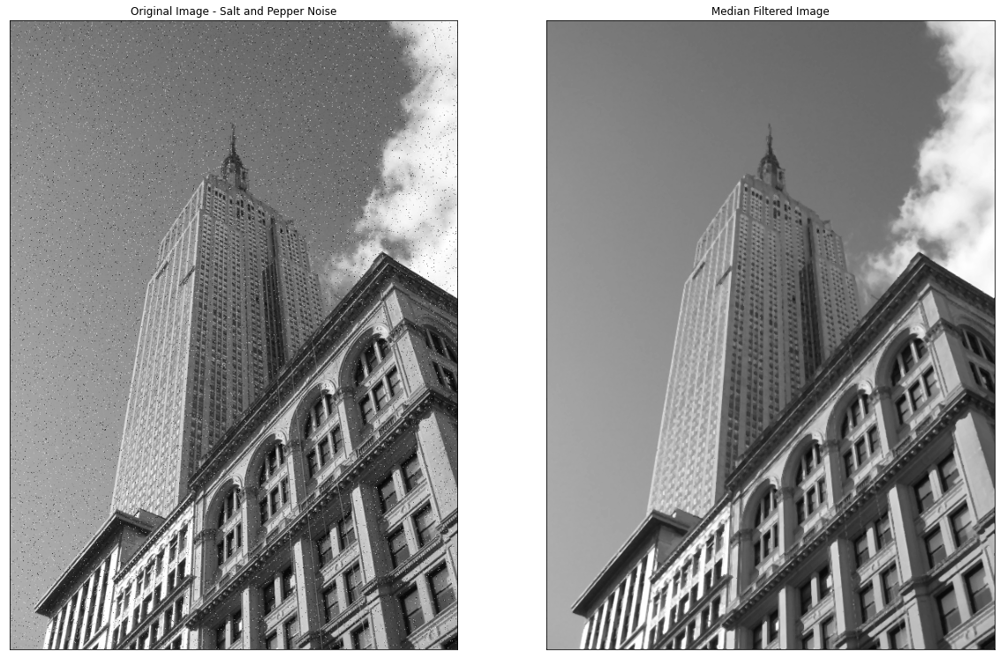

In [ ]:
filter_size = 3
img_result_median_salt_and_pepper = median_filter(img_salt_and_pepper_noise, filter_size)

# display original and gaussian smoothed image
plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(img_salt_and_pepper_noise, cmap="gray")
plt.title("Original Image - Salt and Pepper Noise"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img_result_median_salt_and_pepper, cmap="gray")
plt.title("Median Filtered Image"), plt.xticks([]), plt.yticks([])
plt.show()

### 2.6. Peak-Signal-to-Noise-Ratio (PSNR) -> Salt and Pepper Noise

*   Comparison of Gaussian Filter and Median Filter

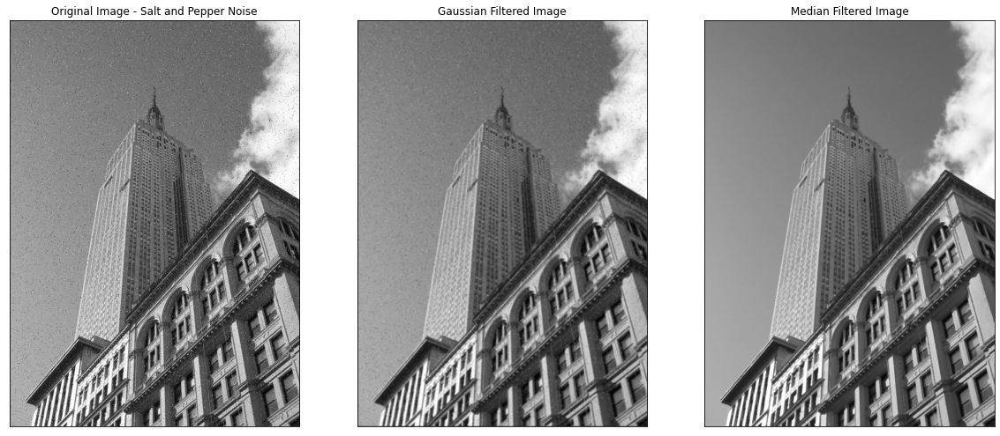

In [ ]:
# display original and gaussian smoothed image
plt.figure(figsize=(20, 20))
plt.subplot(131), plt.imshow(img_salt_and_pepper_noise, cmap="gray")
plt.title("Original Image - Salt and Pepper Noise"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(img_result_gaussian_salt_and_pepper, cmap="gray")
plt.title("Gaussian Filtered Image"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(img_result_median_salt_and_pepper, cmap="gray")
plt.title("Median Filtered Image"), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
base_PSNR = cv2.PSNR(img_tower,img_tower)
gaussian_PSNR = cv2.PSNR(img_tower,img_result_gaussian_salt_and_pepper)
median_PSNR = cv2.PSNR(img_tower,img_result_median_salt_and_pepper)
print("PSNR base: ", base_PSNR)
print("PSNR gaussian: ", gaussian_PSNR)
print("PSNR median: ", box_PSNR)

PSNR base:  361.20199909921956
PSNR gaussian:  26.134994635694667
PSNR median:  24.539892187898502




*   the PSNR value of gaussian filtering is superior to the PSNR value of median filtering.


# 3. Sobel edge detector

### 3.1. Clean Image

In [ ]:
image_path = path+"images/Circles.png"
img_circles = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

image_path = path+"images/Circles_gauss.png"
img_circles_gauss= cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

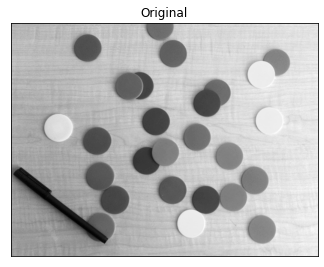

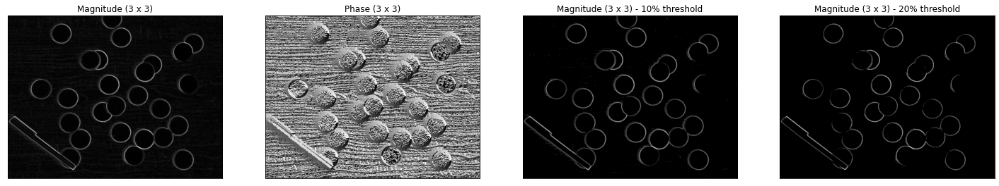

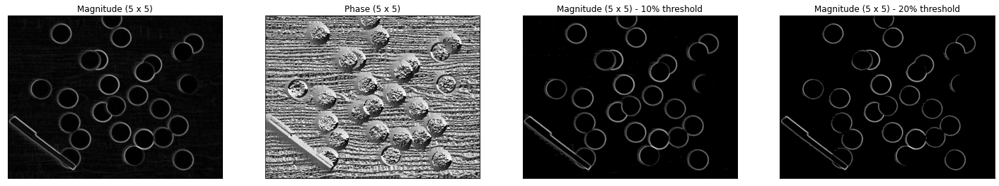

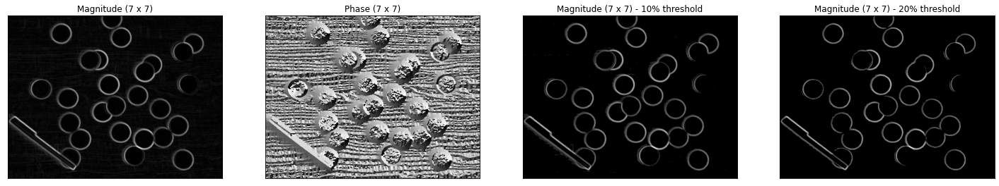

In [ ]:
def my_sobel(input_image,kernel_size):

  I_x = cv2.Sobel(input_image, cv2.CV_64F, 1, 0, ksize=kernel_size)  # derivative in x direction
  I_y = cv2.Sobel(input_image, cv2.CV_64F, 0, 1, ksize=kernel_size)  # derivative in y direction

  # compute sobel Magnitude/Phase
  I_m = cv2.magnitude(I_x, I_y) # information related to how strong the edge is.
  I_p = cv2.phase(I_x, I_y) # phase gives you information related to the direction of the edge.

  # Thresholding
  res_10 = np.zeros_like(I_m)
  res_20 = np.zeros_like(I_m)
  threshold_10 = I_m.max() * 0.1
  threshold_20 = I_m.max() * 0.2
  for i in range(0,I_m.shape[0]): 
    for j in range(0,I_m.shape[1]):
      if (I_m[i,j] > threshold_10):
        res_10[i,j] = I_m[i,j]
      if (I_m[i,j] > threshold_20):
        res_20[i,j] = I_m[i,j]
      
  # Plotting
  plt.figure(figsize=(25, 25))
  plt.subplot(141), plt.imshow(I_m, cmap="gray")
  plt.title("Magnitude ({} x {})".format(kernel_size,kernel_size)), plt.xticks([]), plt.yticks([])
  plt.subplot(142), plt.imshow(I_p, cmap="gray")
  plt.title("Phase ({} x {})".format(kernel_size,kernel_size)), plt.xticks([]), plt.yticks([])
  plt.subplot(143), plt.imshow(res_10, cmap="gray")
  plt.title("Magnitude ({} x {}) - 10% threshold".format(kernel_size,kernel_size)), plt.xticks([]), plt.yticks([])
  plt.subplot(144), plt.imshow(res_20, cmap="gray")
  plt.title("Magnitude ({} x {}) - 20% threshold".format(kernel_size,kernel_size)), plt.xticks([]), plt.yticks([])
  plt.show()

# Plotting
plt.figure(figsize=(5.5, 5.5))
plt.subplot(111), plt.imshow(img_circles, cmap="gray")
plt.title("Original"), plt.xticks([]), plt.yticks([])
plt.show()

# 3x3
my_sobel(img_circles,3)
# # 5x5
my_sobel(img_circles,5)
# 7x7
my_sobel(img_circles,7)


*   As the filter size increases, edge detection gets better.
*   Observation : As the filter size increases, the edges of the rings can be seen to get brighter and more defined.
*   The observation above also applies when the threshold is 10% and 20%






### 3.2. Image corrupted with Gaussian noise

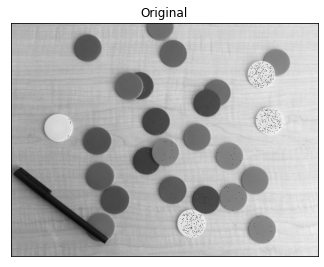

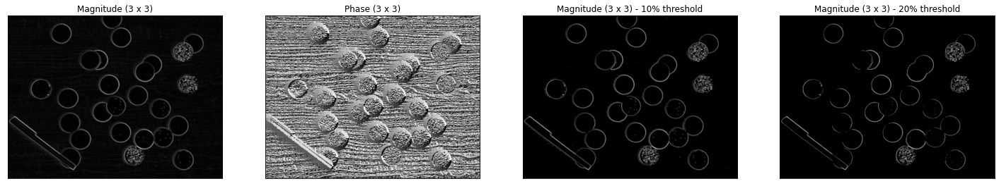

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                                          BELOW ARE THE IMAGES WHERE BOX FILTERING WAS DONE BEFORE APPLYING THE SOBEL EDGE DETECTOR 
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


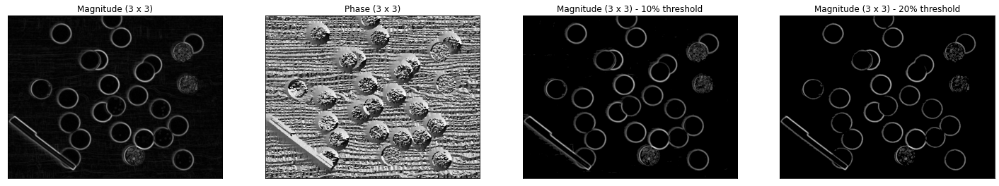

In [ ]:
# Plotting
plt.figure(figsize=(5.5, 5.5))
plt.subplot(111), plt.imshow(img_circles_gauss, cmap="gray")
plt.title("Original"), plt.xticks([]), plt.yticks([])
plt.show()
my_sobel(img_circles_gauss,3)

print("----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------")
print("                                          BELOW ARE THE IMAGES WHERE BOX FILTERING WAS DONE BEFORE APPLYING THE SOBEL EDGE DETECTOR ")
print("----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------")

# 3x3 array for box filtering
kernel_box = np.array([[ 1, 1, 1], 
                   [ 1, 1, 1], 
                   [ 1, 1, 1]])/(9)

# Filter the image using filter2D, which has inputs: (grayscale image, bit-depth, kernel)  
filtered_image_box = cv2.filter2D(img_circles_gauss, cv2.CV_16S, kernel_box)

my_sobel(filtered_image_box, 3)


*   The denoising was not effective in my opinion. It just reduced the intensity of the noise, but the noise is still there and very visible. 
*   I was not expecting much from using box filtering for denoising, the reason being that there was a lot of noise within a small area, and the fact that box filtering basically assigns the center pixel the average pixel value calculated from its neighbours and itself.

